# Climate Data Studio
## Getting started with the Sust Global API

In [68]:
import requests
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, shape, Polygon
from IPython.display import display, HTML
import contextily as ctx
import matplotlib.pyplot as plt
import folium, matplotlib
from utils import display_fwd_timeseries_data, estimated_heatmap

display_df = lambda df: display(HTML(df.to_html()))

API_KEY = "y22BmlNQLBr1AwSH5Yej"
PORTFOLIO = "us-counties"
PROJECT = "cds-demo"

endpoints = {
    "portfolios": f"https://explorer.sustglobal.io/api/portfolios/?api_key={API_KEY}&project={PROJECT}",
    "assets"    : f"https://explorer.sustglobal.io/api/portfolios/{PORTFOLIO}/assets?api_key={API_KEY}&project={PROJECT}&rows=200",
    "summary"   : f"https://explorer.sustglobal.io/api/portfolios/{PORTFOLIO}/datasets/physical/summary?api_key={API_KEY}&project={PROJECT}&rows=200",
    "physical"  : f"https://explorer.sustglobal.io/api/portfolios/{PORTFOLIO}/datasets/physical/items?api_key={API_KEY}&project={PROJECT}&rows=200"
}

explore_defaults = {
    "tiles": ctx.providers.Esri.WorldGrayCanvas,
    "marker_kwds": {
        "radius": 5
    }
}

def get_endpoint_as_df(endpoint_id, params={}, fetch_args={"print_pages": False}):
    
    def fetch_with_pagination(endpoint_id, **kwargs):
        page = 1
        buff = []
        if endpoint_id == "portfolios":
            return pd.DataFrame(requests.get(f'{endpoints[endpoint_id]}').json())
        while True:
            response = requests.get(f'{endpoints[endpoint_id]}&page={page}', params=params).json()
            if len(response) > 0:
                if kwargs["print_pages"]:
                    print(page)
                buff = buff + response
                page += 1
            else:
                return pd.DataFrame(buff)
            
    res_df = fetch_with_pagination(endpoint_id, **fetch_args)
    if endpoint_id == "assets":
        if "geometry" in res_df.columns: # Polygons
            return gpd.GeoDataFrame(res_df.copy().drop("geometry", axis=1), geometry=res_df.geometry.apply(shape), crs="EPSG:4326")
        else: # Points
            return gpd.GeoDataFrame(res_df.copy(), geometry=gpd.points_from_xy(res_df.lng, res_df.lat), crs="EPSG:4326")
    elif endpoint_id == "physical":
        return pd.concat([
            res_df.drop('risk_exposure', axis=1),
            pd.DataFrame(list(res_df.risk_exposure))
        ], axis=1)
    else:
        return res_df
    
    
def map_risk_summary_json_to_single_hazard(summary_series, hazard):
    return pd.concat([
        summary_series.drop("risk_summaries", axis=1), 
        pd.DataFrame(list(summary_series.risk_summaries.apply(lambda s: [i for i in s if i["hazard"] == hazard][0])))
    ], axis=1)


def expand_timeseries_json_to_df(timeseries):
    return pd.DataFrame(list(timeseries))


def get_top_n(df, col, n=10, **kwargs):
    return df.sort_values(col, **kwargs).iloc[0:n].drop("geometry", axis=1)


    

In [69]:
portfolios = get_endpoint_as_df("portfolios")
display_df(portfolios)

,portfolio_id,portfolio_name,created_at,updated_at,status
0,f37fb494bb33d5e7,us-counties,2022-07-18T23:57:21Z,2022-07-19T21:15:01Z,Risk data available


In [70]:
gdf_assets = get_endpoint_as_df("assets")
gdf_assets.geometry = gdf_assets.geometry.simplify(0.01)
gdf_assets.explore(**explore_defaults)

In [71]:
summaries_15_year = get_endpoint_as_df("summary", params={'window': 15, 'scenario': 'ssp585'})
# display_df(summaries)


In [72]:
display_df(summaries_15_year)

,portfolio_name,portfolio_index,entity_name,entity_id,window,window_start_year,scenario,risk_summaries
0,us-counties,0,Cuming,31039,15,2022,ssp585,"[{'hazard': 'cyclone', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'flood_potential', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'heatwave', 'risk_class': 'LOW', 'risk_score': 0.12444445}, {'hazard': 'sea_level_rise', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'water_stress', 'risk_class': 'MEDIUM', 'risk_score': 0.539552980235101}, {'hazard': 'wildfire', 'risk_class': 'LOW', 'risk_score': 0.0047411294032704}]"
1,us-counties,1,Wahkiakum,53069,15,2022,ssp585,"[{'hazard': 'cyclone', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'flood_potential', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'heatwave', 'risk_class': 'LOW', 'risk_score': 0.096}, {'hazard': 'sea_level_rise', 'risk_class': 'MEDIUM', 'risk_score': 0.188488580380048}, {'hazard': 'water_stress', 'risk_class': 'LOW', 'risk_score': 0.0514923691508982}, {'hazard': 'wildfire', 'risk_class': 'LOW', 'risk_score': 0.001903851824508}]"
2,us-counties,2,De Baca,35011,15,2022,ssp585,"[{'hazard': 'cyclone', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'flood_potential', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'heatwave', 'risk_class': 'LOW', 'risk_score': 0.135952375}, {'hazard': 'sea_level_rise', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'water_stress', 'risk_class': 'MEDIUM', 'risk_score': 0.499072158301144}, {'hazard': 'wildfire', 'risk_class': 'LOW', 'risk_score': 0.0055654593997602}]"
3,us-counties,3,Lancaster,31109,15,2022,ssp585,"[{'hazard': 'cyclone', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'flood_potential', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'heatwave', 'risk_class': 'LOW', 'risk_score': 0.13444445}, {'hazard': 'sea_level_rise', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'water_stress', 'risk_class': 'MEDIUM', 'risk_score': 0.594625846349463}, {'hazard': 'wildfire', 'risk_class': 'MEDIUM', 'risk_score': 0.0205986742093942}]"
4,us-counties,4,Nuckolls,31129,15,2022,ssp585,"[{'hazard': 'cyclone', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'flood_potential', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'heatwave', 'risk_class': 'MEDIUM', 'risk_score': 0.1575}, {'hazard': 'sea_level_rise', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'water_stress', 'risk_class': 'MEDIUM', 'risk_score': 0.595908211858991}, {'hazard': 'wildfire', 'risk_class': 'MEDIUM', 'risk_score': 0.042421290251067}]"
5,us-counties,5,Minnehaha,46099,15,2022,ssp585,"[{'hazard': 'cyclone', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'flood_potential', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'heatwave', 'risk_class': 'MEDIUM', 'risk_score': 0.1575}, {'hazard': 'sea_level_rise', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'water_stress', 'risk_class': 'LOW', 'risk_score': 0.222835913195043}, {'hazard': 'wildfire', 'risk_class': 'LOW', 'risk_score': 0.004918874229988}]"
6,us-counties,6,Menard,48327,15,2022,ssp585,"[{'hazard': 'cyclone', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'flood_potential', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'heatwave', 'risk_class': 'MEDIUM', 'risk_score': 0.15863636}, {'hazard': 'sea_level_rise', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'water_stress', 'risk_class': 'LOW', 'risk_score': 0.20505773268887}, {'hazard': 'wildfire', 'risk_class': 'MEDIUM', 'risk_score': 0.0239598142349516}]"
7,us-counties,7,Sierra,6091,15,2022,ssp585,"[{'hazard': 'cyclone', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'flood_potential', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'heatwave', 'risk_class': 'LOW', 'risk_score': 0.12181818}, {'hazard': 'sea_level_rise', 'risk_class': 'LOW', 'risk_score': 0.0}, {'hazard': 'water_stress', 'risk_class': 'LOW', 'risk_score': 0.239480859516754}, {'hazard': 'wildfire', 'risk_class': 'LOW', 'risk_score': 0.0135283239

## Plotting Wildfire Potential

In [73]:
summary = map_risk_summary_json_to_single_hazard(summaries_15_year, "wildfire")
assets_combined_summaries = gdf_assets.merge(summary, on="portfolio_index")
assets_combined_summaries.explore(column='risk_score', cmap='YlOrRd', **explore_defaults)


## Get Top Wildfire Geographies

In [74]:
display_df(get_top_n(assets_combined_summaries, "risk_score", ascending=False))

,portfolio_name_x,portfolio_index,entity_id_x,entity_name_x,labels,portfolio_name_y,entity_name_y,entity_id_y,window,window_start_year,scenario,hazard,risk_class,risk_score
300,us-counties,300,16037,Custer,{},us-counties,Custer,16037,15,2022,ssp585,wildfire,HIGH,0.195012
1605,us-counties,1605,35041,Roosevelt,{},us-counties,Roosevelt,35041,15,2022,ssp585,wildfire,HIGH,0.191397
545,us-counties,545,20139,Osage,{},us-counties,Osage,20139,15,2022,ssp585,wildfire,HIGH,0.183583
1621,us-counties,1621,6011,Colusa,{},us-counties,Colusa,6011,15,2022,ssp585,wildfire,HIGH,0.172675
2068,us-counties,2068,20143,Ottawa,{},us-counties,Ottawa,20143,15,2022,ssp585,wildfire,HIGH,0.162774
1795,us-counties,1795,20127,Morris,{},us-counties,Morris,20127,15,2022,ssp585,wildfire,HIGH,0.162241
3017,us-counties,3017,6021,Glenn,{},us-counties,Glenn,6021,15,2022,ssp585,wildfire,HIGH,0.153709
676,us-counties,676,20149,Pottawatom,{},us-counties,Pottawatom,20149,15,2022,ssp585,wildfire,HIGH,0.153113
3036,us-counties,3036,20197,Wabaunsee,{},us-counties,Wabaunsee,20197,15,2022,ssp585,wildfire,HIGH,0.151544
1246,us-counties,1246,35015,Eddy,{},us-counties,Eddy,35015,15,2022,ssp585,wildfire,HIGH,0.148108


## Plotting Water Stress

In [75]:
summary = map_risk_summary_json_to_single_hazard(summaries_15_year, "water_stress")
assets_combined_summaries = gdf_assets.merge(summary, on="portfolio_index")
assets_combined_summaries.explore(column='risk_score', cmap='YlOrRd', **explore_defaults)

In [76]:
display_df(get_top_n(assets_combined_summaries, "risk_score", ascending=False))

,portfolio_name_x,portfolio_index,entity_id_x,entity_name_x,labels,portfolio_name_y,entity_name_y,entity_id_y,window,window_start_year,scenario,hazard,risk_class,risk_score
386,us-counties,386,4027,Yuma,{},us-counties,Yuma,4027,15,2022,ssp585,water_stress,HIGH,0.646935
517,us-counties,517,6073,San Diego,{},us-counties,San Diego,6073,15,2022,ssp585,water_stress,HIGH,0.644383
336,us-counties,336,6009,Calaveras,{},us-counties,Calaveras,6009,15,2022,ssp585,water_stress,HIGH,0.634366
2456,us-counties,2456,6025,Imperial,{},us-counties,Imperial,6025,15,2022,ssp585,water_stress,HIGH,0.633291
1966,us-counties,1966,6077,San Joaqui,{},us-counties,San Joaqui,6077,15,2022,ssp585,water_stress,HIGH,0.627585
1013,us-counties,1013,6109,Tuolumne,{},us-counties,Tuolumne,6109,15,2022,ssp585,water_stress,HIGH,0.626834
2010,us-counties,2010,6001,Alameda,{},us-counties,Alameda,6001,15,2022,ssp585,water_stress,HIGH,0.625421
2332,us-counties,2332,6099,Stanislaus,{},us-counties,Stanislaus,6099,15,2022,ssp585,water_stress,HIGH,0.624123
661,us-counties,661,6043,Mariposa,{},us-counties,Mariposa,6043,15,2022,ssp585,water_stress,HIGH,0.619183
2886,us-counties,2886,20163,Rooks,{},us-counties,Rooks,20163,15,2022,ssp585,water_stress,HIGH,0.618072


In [82]:
exposure_timeseries = get_endpoint_as_df("physical", params={
    'hazard': 'wildfire', 'indicator': 'unified_prob', 'scenario': 'ssp585', 'measure': 'mid'
})

In [78]:
exposure_timeseries

,portfolio_name,portfolio_index,entity_id,entity_name,hazard,indicator,scenario,measure,1980,1981,...,2091,2092,2093,2094,2095,2096,2097,2098,2099,2100
0,us-counties,26,51775,Salem,wildfire,unified_prob,ssp585,mid,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,us-counties,27,51121,Montgomery,wildfire,unified_prob,ssp585,mid,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,us-counties,86,9007,Middlesex,wildfire,unified_prob,ssp585,mid,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,us-counties,128,18069,Huntington,wildfire,unified_prob,ssp585,mid,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,us-counties,129,21209,Scott,wildfire,unified_prob,ssp585,mid,0.000000,0.002328,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3103,us-counties,3103,13123,Gilmer,wildfire,unified_prob,ssp585,mid,0.001165,0.001038,...,0.001665,0.001593,0.001728,0.001505,0.001645,0.001779,0.001817,0.001773,0.001789,0.001707
3104,us-counties,3104,27135,Roseau,wildfire,unified_prob,ssp585,mid,0.019894,0.020747,...,0.094615,0.074850,0.122018,0.093527,0.120176,0.070111,0.119485,0.173526,0.136130,0.160115
3105,us-counties,3105,28089,Madison,wildfire,unified_prob,ssp585,mid,0.006475,0.005519,...,0.007534,0.007574,0.008186,0.007953,0.007860,0.008482,0.008277,0.008751,0.008250,0.008112
3106,us-counties,3106,48227,Howard,wildfire,unified_prob,ssp585,mid,0.003932,0.003866,...,0.012772,0.009738,0.011031,0.012358,0.010555,0.009661,0.008437,0.015338,0.007957,0.010240


<AxesSubplot:>

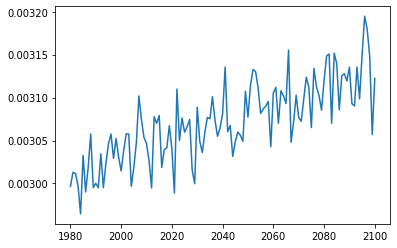

In [85]:
county_to_plot = 386
exposure_timeseries[exposure_timeseries.portfolio_index == county_to_plot][[str(i) for i in range(1980, 2101)]].squeeze().plot()